## Loading & Cleaning Data

In [1974]:
import pandas as pd
import matplotlib.pyplot as plt
import math
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import numpy as np
from scipy.stats.mstats import winsorize
from linearmodels.panel import PanelOLS
import matplotlib.patches as mpatches
import plotly.express as px
import pandas as pd

In [1975]:
RENEWABLE_FILE_PATH = "renewable-share-energy.csv"
GDP_FILE_PATH = "gdp.csv"
OIL_PRICES_FILE_PATH = "oil-prices-inflation-adjusted.csv"
intensity_file_path = 'energy-intensity-of-economies.csv'  
trade_file_path = 'Trade.csv' 

In [1976]:
# Load and clean Renewable Energy data
renewable_df = pd.read_csv(RENEWABLE_FILE_PATH)
renewable_df = renewable_df.rename(columns={'Entity': 'Country_Name', 'Code': 'Country_Code', 'Year': 'Year', 'Renewables': 'Renewable_Share'})
renewable_df = renewable_df.dropna(subset=['Country_Name', 'Year', 'Renewable_Share'])
renewable_df['Year'] = pd.to_numeric(renewable_df['Year'], errors='coerce')
renewable_df['Renewable_Share'] = pd.to_numeric(renewable_df['Renewable_Share'], errors='coerce')
renewable_df = renewable_df.sort_values(by=['Country_Name', 'Year'])
renewable_df.head()

,Country_Name,Country_Code,Year,Renewable_Share
0,Africa,NaN,1965,5.740281
1,Africa,NaN,1966,6.113969
2,Africa,NaN,1967,6.316580
3,Africa,NaN,1968,6.994845
4,Africa,NaN,1969,7.943916


In [1977]:
# Load and clean TFP data
tfp_df = pd.read_csv('TFP.csv')
tfp_df.columns = ['Country_Name','Country_Code', 'Year', 'TFP']
tfp_df['TFP'] = pd.to_numeric(tfp_df['TFP'], errors='coerce')
tfp_df =tfp_df.dropna(subset=['Country_Name', 'Country_Code', 'Year', 'TFP'])
tfp_df = tfp_df.sort_values(by=['Country_Name', 'Year'])
tfp_df.head()

,Country_Name,Country_Code,Year,TFP
0,Angola,AGO,1974,1.227137
1,Angola,AGO,1975,1.122005
2,Angola,AGO,1976,1.025299
3,Angola,AGO,1977,0.996829
4,Angola,AGO,1978,0.915052


In [1978]:
#Load & Clean the Energy Intensity Data
intensity_df = pd.read_csv(intensity_file_path)

intensity_df = intensity_df.rename(columns={
    'Entity': 'Country_Name',
    'Code': 'Country_Code',
    'Year': 'Year',
    'Energy intensity level of primary energy (MJ/$2017 PPP GDP)': 'Energy_Intensity'
})

intensity_df = intensity_df.dropna(subset=['Country_Name', 'Year', 'Energy_Intensity'])

intensity_df['Year'] = intensity_df['Year'].astype(int)

intensity_df['Energy_Intensity'] = pd.to_numeric(intensity_df['Energy_Intensity'], errors='coerce')

intensity_df


,Country_Name,Country_Code,Year,Energy_Intensity
0,Afghanistan,AFG,2000,1.50
1,Afghanistan,AFG,2001,1.50
2,Afghanistan,AFG,2002,1.40
3,Afghanistan,AFG,2003,1.39
4,Afghanistan,AFG,2004,1.21
...,...,...,...,...
4794,Zimbabwe,ZWE,2017,13.62
4795,Zimbabwe,ZWE,2018,13.64
4796,Zimbabwe,ZWE,2019,14.35
4797,Zimbabwe,ZWE,2020,15.05


In [1979]:
# Load & Clean the Trade Data
trade_df = pd.read_csv(trade_file_path)

trade_df= trade_df.rename(columns={'Country Name': 'Country_Name', 'Country Code': 'Country_Code'})

year_columns = [col for col in trade_df.columns if col.isdigit()]

trade_df = trade_df.melt(id_vars=['Country_Name', 'Country_Code'], 
                             value_vars=year_columns,
                             var_name='Year', 
                             value_name='Trade')

trade_df['Year'] = trade_df['Year'].astype(int)

trade_df['Trade'] = pd.to_numeric(trade_df['Trade'], errors='coerce')

trade_df = trade_df.dropna(subset=['Country_Name', 'Country_Code', 'Year', 'Trade'])

trade_df.head()


,Country_Name,Country_Code,Year,Trade
3,Africa Western and Central,AFW,1960,33.023260
9,Argentina,ARG,1960,15.208096
13,Australia,AUS,1960,27.007343
16,Burundi,BDI,1960,25.892857
18,Benin,BEN,1960,18.234200


In [1980]:
# Load and clean GDP data
gdp_df = pd.read_csv(GDP_FILE_PATH)
gdp_df = gdp_df.rename(columns={'Entity': 'Country_Name', 'Code': 'Country_Code', 'Year': 'Year', 'GDP per capita': 'GDP_Per_Capita'})
gdp_df = gdp_df.dropna(subset=['Country_Name', 'Country_Code', 'Year', 'GDP_Per_Capita'])
gdp_df['Year'] = gdp_df['Year'].astype(int)
gdp_df['GDP_Per_Capita'] = pd.to_numeric(gdp_df['GDP_Per_Capita'], errors='coerce')
gdp_df


,Country_Name,Country_Code,Year,GDP_Per_Capita
0,Afghanistan,AFG,2002,1280.4631
1,Afghanistan,AFG,2003,1292.3335
2,Afghanistan,AFG,2004,1260.0605
3,Afghanistan,AFG,2005,1352.3207
4,Afghanistan,AFG,2006,1366.9932
...,...,...,...,...
6557,Zimbabwe,ZWE,2018,2399.6216
6558,Zimbabwe,ZWE,2019,2203.3967
6559,Zimbabwe,ZWE,2020,1990.3195
6560,Zimbabwe,ZWE,2021,2115.1445


In [1981]:
# Load and clean oil prices data
oil_prices_df = pd.read_csv(OIL_PRICES_FILE_PATH)
oil_prices_df = oil_prices_df.rename(columns={'Year': 'Year', 'Oil price': 'Oil_Price'})
oil_prices_df = oil_prices_df[oil_prices_df['Entity'] == 'World']  
oil_prices_df = oil_prices_df[['Year', 'Oil_Price']]  
oil_prices_df = oil_prices_df.dropna(subset=['Year', 'Oil_Price'])
oil_prices_df['Year'] = oil_prices_df['Year'].astype(int)
oil_prices_df['Oil_Price'] = pd.to_numeric(oil_prices_df['Oil_Price'], errors='coerce')
oil_prices_df

,Year,Oil_Price
0,1861,109.98432
1,1862,206.43213
2,1863,496.14948
3,1864,1014.44310
4,1865,800.01080
...,...,...
158,2019,481.34860
159,2020,309.81543
160,2021,501.54495
161,2022,663.51526


In [1982]:
# Merge datasets
final_df = tfp_df.merge(renewable_df.drop(columns=['Country_Code']), on=['Country_Name', 'Year'], how='left')
final_df = final_df.merge(gdp_df.drop(columns=['Country_Code']), on=['Country_Name', 'Year'], how='left')
final_df =final_df.merge(oil_prices_df, on='Year', how='left')  
final_df = final_df.merge(trade_df.drop(columns=['Country_Code']), on=['Country_Name', 'Year'], how='left')
final_df = final_df.merge(intensity_df.drop(columns=['Country_Code']), on=['Country_Name', 'Year'], how='left')
final_df=final_df.dropna()


## Filtering

In [1984]:
valid_countries = final_df.groupby('Country_Name').filter(lambda x: set(range(2000, 2020)).issubset(set(x['Year'])))["Country_Name"].unique()
final_df = final_df[final_df['Country_Name'].isin(valid_countries)]
country_years = final_df.groupby('Country_Name').nunique()


In [1985]:
# List of non-country regions/groups to remove
regions_to_remove = [
    'Africa Eastern and Southern', 'Africa Western and Central', 'Arab World',
    'Caribbean small states', 'Central Europe and the Baltics', 'Early-demographic dividend',
    'Euro area', 'Europe & Central Asia', 'Europe & Central Asia (excluding high income)',
    'European Union', 'Heavily indebted poor countries (HIPC)', 'High income',
    'IDA blend', 'IDA only', 'IDA total', 'Latin America & Caribbean',
    'Latin America & Caribbean (excluding high income)',
    'Latin America & the Caribbean (IDA & IBRD countries)',
    'Least developed countries: UN classification', 'Low income',
    'Lower middle income', 'Middle East & North Africa',
    'Middle East & North Africa (IDA & IBRD countries)',
    'Middle East & North Africa (excluding high income)',
    'North America', 'OECD members', 'Pacific island small states',
    'Post-demographic dividend', 'Pre-demographic dividend',
    'Small states', 'South Asia', 'South Asia (IDA & IBRD)',
    'Sub-Saharan Africa', 'Sub-Saharan Africa (IDA & IBRD countries)',
    'Sub-Saharan Africa (excluding high income)','World'
]

final_df = final_df[~final_df['Country_Name'].isin(regions_to_remove)]

unique_countries = final_df['Country_Name'].unique()
unique_countries


array(['Argentina', 'Australia', 'Austria', 'Belgium', 'Brazil',
       'Bulgaria', 'Canada', 'Chile', 'China', 'Colombia', 'Croatia',
       'Czechia', 'Denmark', 'Ecuador', 'Estonia', 'Finland', 'France',
       'Germany', 'Greece', 'Hungary', 'India', 'Indonesia', 'Ireland',
       'Israel', 'Italy', 'Japan', 'Kazakhstan', 'Latvia', 'Lithuania',
       'Luxembourg', 'Malaysia', 'Mexico', 'Morocco', 'Netherlands',
       'New Zealand', 'Norway', 'Peru', 'Philippines', 'Poland',
       'Portugal', 'Romania', 'Saudi Arabia', 'Slovenia', 'South Africa',
       'Spain', 'Sweden', 'Switzerland', 'Thailand', 'Ukraine',
       'United Kingdom', 'United States'], dtype=object)

In [1986]:
final_df=final_df.dropna()
final_df.head()


,Country_Name,Country_Code,Year,TFP,Renewable_Share,GDP_Per_Capita,Oil_Price,Trade,Energy_Intensity
74,Argentina,ARG,2000,0.980926,12.283152,18524.810,317.14212,22.622445,3.69
75,Argentina,ARG,2001,0.943316,15.936240,17514.504,264.57272,21.852255,3.59
76,Argentina,ARG,2002,0.863560,16.247978,15439.745,266.61496,41.752724,3.98
77,Argentina,ARG,2003,0.921750,14.406610,16631.574,300.36360,40.644748,3.96
78,Argentina,ARG,2004,0.964345,12.185576,17950.150,388.25730,40.692646,4.04


In [1987]:
country_years_check = final_df.groupby('Country_Name')['Year'].apply(lambda x: set(range(2000, 2020)).difference(set(x)))

missing_years_countries = country_years_check[country_years_check.apply(len) > 0]

final_df_cleaned = final_df[~final_df['Country_Name'].isin(missing_years_countries.index)]

removed_countries = missing_years_countries.index.tolist()

final_df_cleaned.shape, removed_countries


((1020, 9), [])

In [1988]:
num_unique_countries = final_df_cleaned['Country_Name'].unique()
num_unique_countries

array(['Argentina', 'Australia', 'Austria', 'Belgium', 'Brazil',
       'Bulgaria', 'Canada', 'Chile', 'China', 'Colombia', 'Croatia',
       'Czechia', 'Denmark', 'Ecuador', 'Estonia', 'Finland', 'France',
       'Germany', 'Greece', 'Hungary', 'India', 'Indonesia', 'Ireland',
       'Israel', 'Italy', 'Japan', 'Kazakhstan', 'Latvia', 'Lithuania',
       'Luxembourg', 'Malaysia', 'Mexico', 'Morocco', 'Netherlands',
       'New Zealand', 'Norway', 'Peru', 'Philippines', 'Poland',
       'Portugal', 'Romania', 'Saudi Arabia', 'Slovenia', 'South Africa',
       'Spain', 'Sweden', 'Switzerland', 'Thailand', 'Ukraine',
       'United Kingdom', 'United States'], dtype=object)

In [1989]:
final_df_cleaned.head()

,Country_Name,Country_Code,Year,TFP,Renewable_Share,GDP_Per_Capita,Oil_Price,Trade,Energy_Intensity
74,Argentina,ARG,2000,0.980926,12.283152,18524.810,317.14212,22.622445,3.69
75,Argentina,ARG,2001,0.943316,15.936240,17514.504,264.57272,21.852255,3.59
76,Argentina,ARG,2002,0.863560,16.247978,15439.745,266.61496,41.752724,3.98
77,Argentina,ARG,2003,0.921750,14.406610,16631.574,300.36360,40.644748,3.96
78,Argentina,ARG,2004,0.964345,12.185576,17950.150,388.25730,40.692646,4.04


## Adding two other Confounder 

In [2015]:
fdi_path = "FDI.csv"
inflation_path = "Inflation.csv"

df_fdi = pd.read_csv(fdi_path)
df_inflation = pd.read_csv(inflation_path)


### Cleaning New Variable Data

In [2017]:
df_fdi_long = df_fdi.melt(id_vars=["Country Name", "Country Code"], var_name="Year", value_name="FDI_Value")
df_fdi_long.rename(columns={"Country Name": "Country_Name", "Country Code": "Country_Code"}, inplace=True)

df_inflation_long = df_inflation.melt(id_vars=["Country Name", "Country Code"], var_name="Year", value_name="Inflation_Rate")
df_inflation_long.rename(columns={"Country Name": "Country_Name", "Country Code": "Country_Code"}, inplace=True)

df_fdi_long["Year"] = pd.to_numeric(df_fdi_long["Year"], errors="coerce")
df_inflation_long["Year"] = pd.to_numeric(df_inflation_long["Year"], errors="coerce")

df_merged = final_df_cleaned.merge(df_fdi_long, on=["Country_Name", "Country_Code", "Year"], how="left")
df_merged = df_merged.merge(df_inflation_long, on=["Country_Name", "Country_Code", "Year"], how="left")

df_final_merged["FDI_Value"] = pd.to_numeric(df_final_merged["FDI_Value"], errors="coerce")
df_final_merged["Inflation_Rate"] = pd.to_numeric(df_final_merged["Inflation_Rate"], errors="coerce")

df_final_merged = df_final_merged.replace([np.inf, -np.inf], np.nan).dropna()

df_final_merged.head()

,Country_Name,Country_Code,Year,TFP,Renewable_Share,GDP_Per_Capita,Oil_Price,Trade,Energy_Intensity,FDI_Value,Inflation_Rate,Industry_Value_Added,TFP_std,Renewable_Share_std
20,Australia,AUS,2000,0.923783,3.988878,38412.640,317.14212,40.935211,6.00,3.578599,4.457435,24.550533,-2.676193,-0.824177
21,Australia,AUS,2001,0.951553,3.870762,38690.570,264.57272,44.218705,5.71,2.823052,4.407135,23.633521,-1.070398,-0.899847
22,Australia,AUS,2002,0.955918,3.931450,39775.270,266.61496,41.449092,5.54,3.703067,2.981575,23.611732,-0.818005,-0.860968
23,Australia,AUS,2003,0.966869,4.014968,40535.668,300.36360,40.201567,5.57,1.920995,2.732596,24.042096,-0.184740,-0.807462
24,Australia,AUS,2004,0.971718,4.036560,41798.720,388.25730,37.009614,5.45,6.980717,2.343255,23.934919,0.095644,-0.793629


## Summary Statistics

In [ ]:
summary_statistics = df_final_merged.describe().round(2)
summary_statistics

## Computing VIF and Correlation

#### Orginal Variable

In [2208]:

selected_vars = [ "Renewable_Share", "GDP_Per_Capita", "Oil_Price", "Trade", "Energy_Intensity", "FDI_Value", "Inflation_Rate"]
df_selected = df_final_merged[selected_vars]

vif_data_selected = pd.DataFrame()
vif_data_selected["Variable"] = df_selected.columns
vif_data_selected["VIF"] = [variance_inflation_factor(df_selected.values, i) for i in range(df_selected.shape[1])]

vif_data_selected


,Variable,VIF
0,Renewable_Share,2.080120
1,GDP_Per_Capita,5.347302
2,Oil_Price,5.413983
3,Trade,6.124208
4,Energy_Intensity,4.402500
5,FDI_Value,1.488297
6,Inflation_Rate,1.602825


#### Transformed Variable

In [2210]:

log_transformed_new = np.log(df_selected+ 1e-6)

log_transformed_new.replace([np.inf, -np.inf], np.nan, inplace=True)  
log_transformed_new = log_transformed_new.dropna()  

vif_data_log_new = pd.DataFrame()
vif_data_log_new["Variable"] = log_transformed_new.columns
vif_data_log_new["VIF"] = [variance_inflation_factor(log_transformed_new.values, i) for i in range(log_transformed_new.shape[1])]

vif_data_log_new


/opt/anaconda3/lib/python3.12/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning:

invalid value encountered in log



,Variable,VIF
0,Renewable_Share,2.276937
1,GDP_Per_Capita,162.197738
2,Oil_Price,149.478924
3,Trade,97.601234
4,Energy_Intensity,17.110002
5,FDI_Value,2.375124
6,Inflation_Rate,2.289961


#### Correlation Heatmap

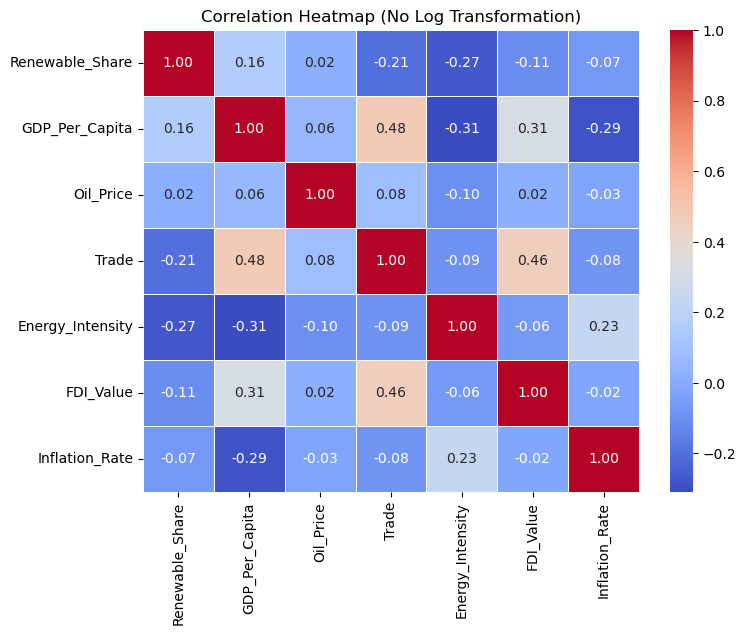

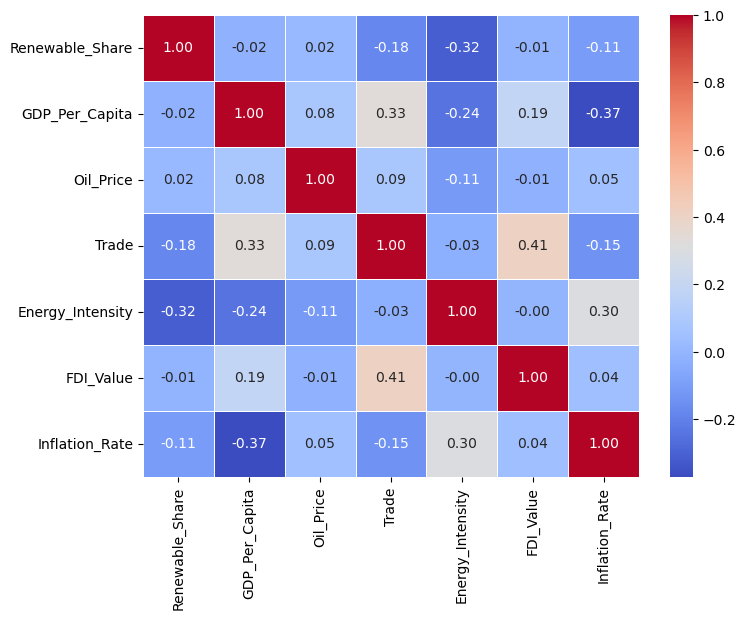

In [2226]:
corr_no_log=df_selected.corr()

corr_log = log_transformed_new.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_no_log, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap (No Log Transformation)")
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_log, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.savefig("Heatmap_log.png")
plt.show()


## Regression Analysis

### Original Variable

In [2027]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

from sklearn.preprocessing import StandardScaler



df_standardized = df_final_merged.sort_values(by=["Country_Name", "Year"]).copy()

independent_vars = ["Renewable_Share", "GDP_Per_Capita","Trade","Oil_Price",
                    "Energy_Intensity", "FDI_Value", "Inflation_Rate"]

scaler = StandardScaler()
df_standardized[independent_vars] = scaler.fit_transform(df_standardized[independent_vars])

fe_model = smf.ols("TFP ~ " + " + ".join(independent_vars) + " + C(Country_Name)", 
                   data=df_standardized).fit()

# First-Difference (FD) Transformation
df_fd = df_standardized.copy()
df_fd[independent_vars + ["TFP"]] = df_fd.groupby("Country_Name")[independent_vars + ["TFP"]].diff()


# First-Difference (FD) Regression
fd_model = smf.ols("TFP ~ " + " + ".join(independent_vars), 
                    data=df_fd).fit()


fe_summary = fe_model.summary()
fd_summary = fd_model.summary()

fe_model_robust = fe_model.get_robustcov_results(cov_type="HC3")

# First-Difference (FD) Model with Robust Standard Errors
fd_model_robust = fd_model.get_robustcov_results(cov_type="HC3")




with open("multiple_regression_results.txt", "w") as f:
    f.write("Regression Model fixed effect:\n")
    f.write(fe_model.summary().as_text())
    f.write("\n\n")
    
    f.write("Regression Model first difference:\n")
    f.write(fd_model.summary().as_text())
    f.write("\n\n")

    f.write("Regression Model fixed effect hetro:\n")
    f.write(fe_model_robust.summary().as_text())
    f.write("\n\n")

    f.write("Regression Model first diff hetro:\n")
    f.write(fd_model_robust.summary().as_text())
    f.write("\n")

print("All regression results saved to 'multiple_regression_results.txt'")


All regression results saved to 'multiple_regression_results.txt'


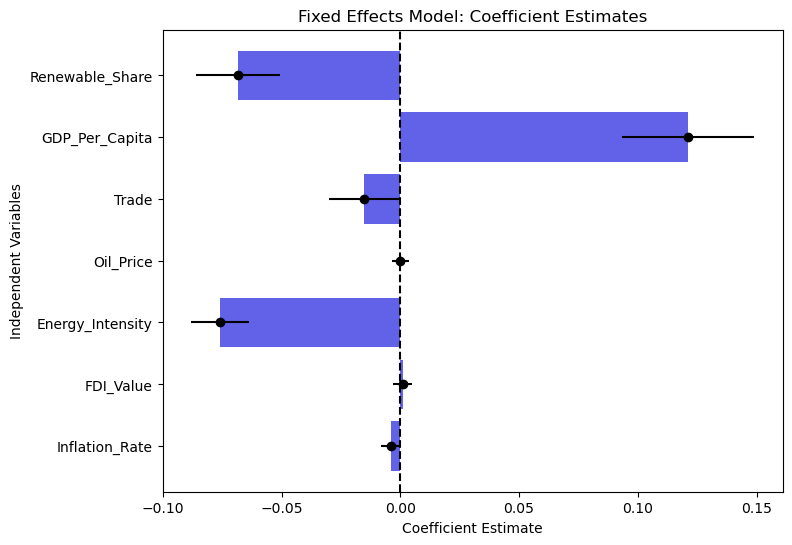

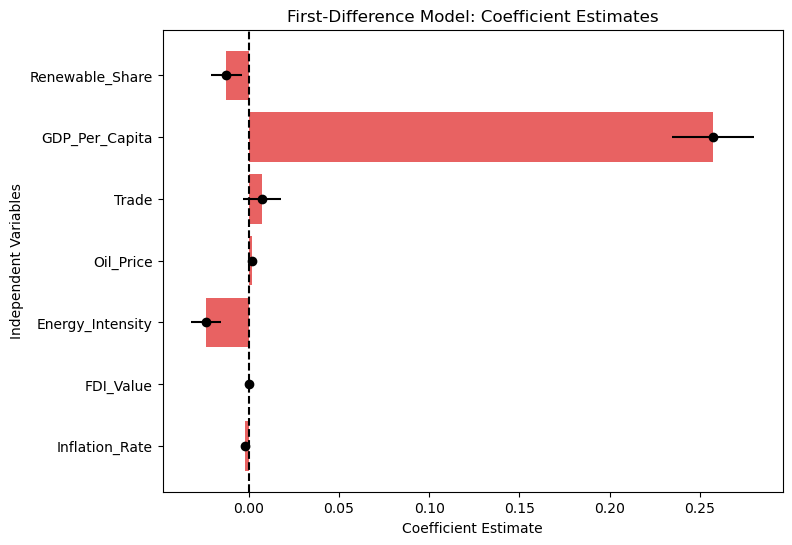

In [2028]:

fe_coefs = fe_model.params[independent_vars]
fe_conf_int = fe_model.conf_int().loc[independent_vars]

fd_coefs = fd_model.params[independent_vars]
fd_conf_int = fd_model.conf_int().loc[independent_vars]

fe_plot_df = pd.DataFrame({"Coefficient": fe_coefs, "Lower CI": fe_conf_int[0], "Upper CI": fe_conf_int[1]})
fd_plot_df = pd.DataFrame({"Coefficient": fd_coefs, "Lower CI": fd_conf_int[0], "Upper CI": fd_conf_int[1]})

# Plot Fixed Effects Model Coefficients
plt.figure(figsize=(8, 6))
sns.barplot(y=fe_plot_df.index, x=fe_plot_df["Coefficient"], color="blue", alpha=0.7)
plt.errorbar(fe_plot_df["Coefficient"], fe_plot_df.index, 
             xerr=[fe_plot_df["Coefficient"] - fe_plot_df["Lower CI"], 
                   fe_plot_df["Upper CI"] - fe_plot_df["Coefficient"]], fmt="o", color="black")
plt.axvline(x=0, color="black", linestyle="--")
plt.title("Fixed Effects Model: Coefficient Estimates")
plt.xlabel("Coefficient Estimate")
plt.ylabel("Independent Variables")
plt.show()

# Plot First-Difference Model Coefficients
plt.figure(figsize=(8, 6))
sns.barplot(y=fd_plot_df.index, x=fd_plot_df["Coefficient"], color="red", alpha=0.7)
plt.errorbar(fd_plot_df["Coefficient"], fd_plot_df.index, 
             xerr=[fd_plot_df["Coefficient"] - fd_plot_df["Lower CI"], 
                   fd_plot_df["Upper CI"] - fd_plot_df["Coefficient"]], fmt="o", color="black")
plt.axvline(x=0, color="black", linestyle="--")
plt.title("First-Difference Model: Coefficient Estimates")
plt.xlabel("Coefficient Estimate")
plt.ylabel("Independent Variables")
plt.show()


### Log Transformation

In [2030]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from linearmodels.panel import PanelOLS

df_final_merged = df_final_merged.sort_values(by=["Country_Name", "Year"])

independent_vars = ["Renewable_Share", "GDP_Per_Capita",
                    "Energy_Intensity", "Inflation_Rate", "FDI_Value"]

df_final_merged_log = df_final_merged.copy()
df_final_merged_log[independent_vars + ["TFP"]] = np.log(df_final_merged_log[independent_vars + ["TFP"]] + 1e-6)

df_fd_log = df_final_merged_log.copy()
df_fd_log[independent_vars + ["TFP"]] = df_fd_log.groupby("Country_Name")[independent_vars + ["TFP"]].diff()
df_fd_log = df_fd_log.dropna()

df_final_merged_log = df_final_merged_log.set_index(["Country_Name", "Year"]) 
df_fd_log = df_fd_log.set_index(["Country_Name", "Year"])  

y_fe = df_final_merged_log["TFP"]
X_fe = df_final_merged_log[independent_vars]
X_fe = sm.add_constant(X_fe)  

y_fd = df_fd_log["TFP"]
X_fd = df_fd_log[independent_vars]
X_fd = sm.add_constant(X_fd)  

fe_log_model = PanelOLS(y_fe, X_fe, entity_effects=True, time_effects=True, drop_absorbed=True).fit()
fd_log_model = sm.OLS(y_fd, X_fd).fit()

fe_log_model_robust = PanelOLS(y_fe, X_fe, entity_effects=True, time_effects=True, drop_absorbed=True).fit(cov_type="robust")
fd_log_model_robust = fd_log_model.get_robustcov_results(cov_type="HC3")

with open("multiple_regression_results_log.txt", "w") as f:
    f.write("Regression Model Fixed Effects:\n")
    f.write(fe_log_model.summary.as_text())  
    f.write("\n\n")
    
    f.write("Regression Model First Difference:\n")
    f.write(fd_log_model.summary().as_text())  
    f.write("\n\n")

    f.write("Regression Model Fixed Effects (Heteroskedasticity Robust):\n")
    f.write(fe_log_model_robust.summary.as_text()) 
    f.write("\n\n")

    f.write("Regression Model First Difference (Heteroskedasticity Robust):\n")
    f.write(fd_log_model_robust.summary().as_text())  
    f.write("\n")

print("All regression results saved to 'multiple_regression_results_log.txt'")


All regression results saved to 'multiple_regression_results_log.txt'


/opt/anaconda3/lib/python3.12/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)
/opt/anaconda3/lib/python3.12/site-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)
/opt/anaconda3/lib/python3.12/site-packages/linearmodels/panel/model.py:1260: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(dependent, exog, weights=weights, check_rank=check_rank)


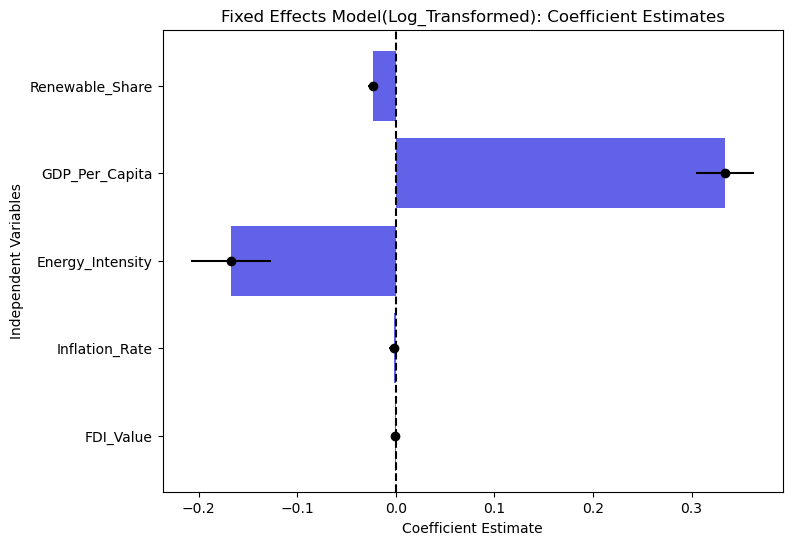

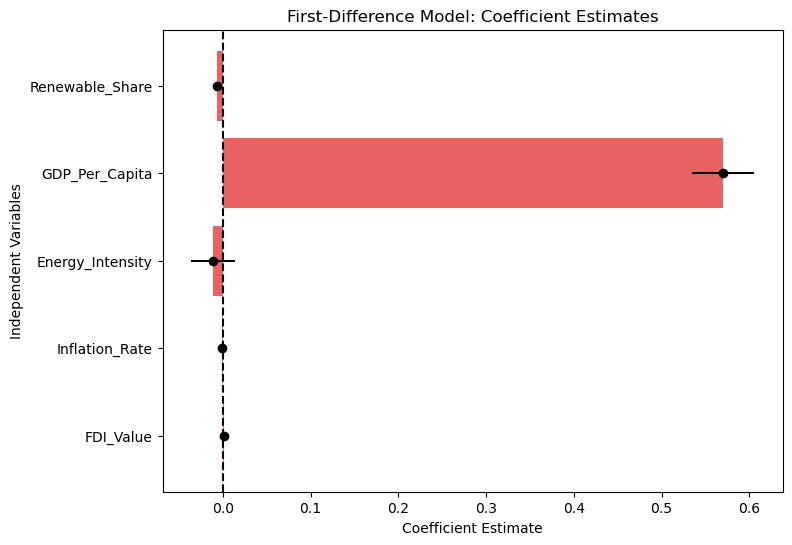

In [2031]:
fe_log_coefs = fe_log_model.params[independent_vars]
fe_log_conf_int = fe_log_model.conf_int().loc[independent_vars]

fd_log_coefs = fd_log_model.params[independent_vars]
fd_log_conf_int = fd_log_model.conf_int().loc[independent_vars]

fe_log_plot_df = pd.DataFrame({"Coefficient": fe_log_coefs, "Lower CI": fe_log_conf_int.iloc[:,0], "Upper CI": fe_log_conf_int.iloc[:,1]})
fd_log_plot_df = pd.DataFrame({"Coefficient": fd_log_coefs, "Lower CI": fd_log_conf_int.iloc[:,0], "Upper CI": fd_log_conf_int.iloc[:,1]})

plt.figure(figsize=(8, 6))
sns.barplot(y=fe_log_plot_df.index, x=fe_log_plot_df["Coefficient"], color="blue", alpha=0.7)
plt.errorbar(fe_log_plot_df["Coefficient"], fe_log_plot_df.index, 
             xerr=[fe_log_plot_df["Coefficient"] - fe_log_plot_df["Lower CI"], 
                   fe_log_plot_df["Upper CI"] - fe_log_plot_df["Coefficient"]], fmt="o", color="black")
plt.axvline(x=0, color="black", linestyle="--")
plt.title("Fixed Effects Model(Log_Transformed): Coefficient Estimates")
plt.xlabel("Coefficient Estimate")
plt.ylabel("Independent Variables")
plt.show()

plt.figure(figsize=(8, 6))
sns.barplot(y=fd_log_plot_df.index, x=fd_log_plot_df["Coefficient"], color="red", alpha=0.7)
plt.errorbar(fd_log_plot_df["Coefficient"], fd_log_plot_df.index, 
             xerr=[fd_log_plot_df["Coefficient"] - fd_log_plot_df["Lower CI"], 
                   fd_log_plot_df["Upper CI"] - fd_log_plot_df["Coefficient"]], fmt="o", color="black")
plt.axvline(x=0, color="black", linestyle="--")
plt.title("First-Difference Model: Coefficient Estimates")
plt.xlabel("Coefficient Estimate")
plt.ylabel("Independent Variables")
plt.show()


In [2034]:
df_final_merged.to_csv("df_final_merged.csv", index=False)



## Event Study

In [2036]:
event_study = pd.read_csv("event_study.csv")
event_study.head()

,Country,Event,Event Year
0,Norway,Joint Green Certificate Market with Sweden,2012
1,Sweden,Electricity Certificate System,2003
2,Brazil,PROINFA Program,2002
3,Denmark,Energy Agreement,2012
4,New Zealand,New Zealand Energy Strategy,2011


In [2037]:
df_event_study = pd.read_csv("df_event_study_final.csv")
df_event_study.head()

,Country_Name,Country_Code,Year,TFP,Renewable_Share,GDP_Per_Capita,Oil_Price,Trade,Energy_Intensity,FDI_Value,Inflation_Rate,Industry_Value_Added,Event,Event Year,Event_Time
0,Australia,AUS,2000,0.923783,3.988878,38412.640,317.14212,40.935211,6.00,3.578599,4.457435,24.550533,No Event,NaN,NaN
1,Australia,AUS,2001,0.951553,3.870762,38690.570,264.57272,44.218705,5.71,2.823052,4.407135,23.633521,No Event,NaN,NaN
2,Australia,AUS,2002,0.955918,3.931450,39775.270,266.61496,41.449092,5.54,3.703067,2.981575,23.611732,No Event,NaN,NaN
3,Australia,AUS,2003,0.966869,4.014968,40535.668,300.36360,40.201567,5.57,1.920995,2.732596,24.042096,No Event,NaN,NaN
4,Australia,AUS,2004,0.971718,4.036560,41798.720,388.25730,37.009614,5.45,6.980717,2.343255,23.934919,No Event,NaN,NaN


In [2038]:
df_event_study["Event_Time"] = df_event_study["Event_Time"].astype("Int64")  
event_time_dummies = pd.get_dummies(df_event_study["Event_Time"], prefix="EventTime")

event_time_dummies = event_time_dummies.astype(int)

df_event_study = df_event_study.drop(columns=[col for col in df_event_study.columns if "EventTime_" in col], errors="ignore")
df_event_study = pd.concat([df_event_study, event_time_dummies], axis=1)

event_time_dummies = [col for col in event_time_dummies.columns if col != "EventTime_0"]

df_event_study.head()

,Country_Name,Country_Code,Year,TFP,Renewable_Share,GDP_Per_Capita,Oil_Price,Trade,Energy_Intensity,FDI_Value,...,EventTime_-4,EventTime_-3,EventTime_-2,EventTime_-1,EventTime_0,EventTime_1,EventTime_2,EventTime_3,EventTime_4,EventTime_5
0,Australia,AUS,2000,0.923783,3.988878,38412.640,317.14212,40.935211,6.00,3.578599,...,0,0,0,0,0,0,0,0,0,0
1,Australia,AUS,2001,0.951553,3.870762,38690.570,264.57272,44.218705,5.71,2.823052,...,0,0,0,0,0,0,0,0,0,0
2,Australia,AUS,2002,0.955918,3.931450,39775.270,266.61496,41.449092,5.54,3.703067,...,0,0,0,0,0,0,0,0,0,0
3,Australia,AUS,2003,0.966869,4.014968,40535.668,300.36360,40.201567,5.57,1.920995,...,0,0,0,0,0,0,0,0,0,0
4,Australia,AUS,2004,0.971718,4.036560,41798.720,388.25730,37.009614,5.45,6.980717,...,0,0,0,0,0,0,0,0,0,0


In [2039]:
df_event_study.to_csv("df_event_study.csv", index=False)

In [2040]:
import statsmodels.formula.api as smf

formula = "TFP ~ " + " + ".join(event_time_dummies) + " + C(Country_Name) + C(Year)"

print("Regression Formula: \n", formula)


Regression Formula: 
 TFP ~ EventTime_-5 + EventTime_-4 + EventTime_-3 + EventTime_-2 + EventTime_-1 + EventTime_1 + EventTime_2 + EventTime_3 + EventTime_4 + EventTime_5 + C(Country_Name) + C(Year)


In [2041]:
df_event_study[event_time_dummies].apply(pd.Series.unique)


,EventTime_-5,EventTime_-4,EventTime_-3,EventTime_-2,EventTime_-1,EventTime_1,EventTime_2,EventTime_3,EventTime_4,EventTime_5
0,0,0,0,0,0,0,0,0,0,0
1,1,1,1,1,1,1,1,1,1,1


In [2042]:
event_time_dummies_renamed = {col: col.replace("EventTime_-", "EventTime_neg") for col in event_time_dummies}
df_event_study = df_event_study.rename(columns=event_time_dummies_renamed)

event_time_dummies = list(event_time_dummies_renamed.values())

df_event_study[event_time_dummies] = df_event_study[event_time_dummies].astype(int)

print("Updated Event-Time Dummy Columns:", event_time_dummies)


Updated Event-Time Dummy Columns: ['EventTime_neg5', 'EventTime_neg4', 'EventTime_neg3', 'EventTime_neg2', 'EventTime_neg1', 'EventTime_1', 'EventTime_2', 'EventTime_3', 'EventTime_4', 'EventTime_5']


In [2043]:
formula = "TFP ~ " + " + ".join(event_time_dummies) + " + C(Country_Name) + C(Year)"

model = smf.ols(formula, data=df_event_study).fit()

with open("event study.txt", "w") as f:
    f.write("Regression Model fixed effect event study:\n")
    f.write(model.summary().as_text())

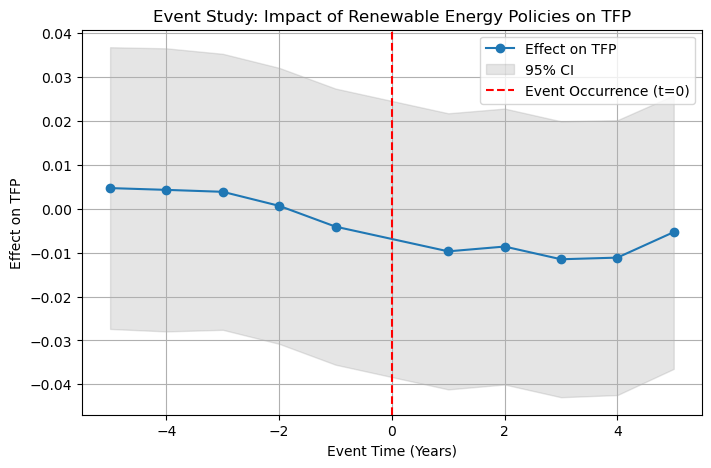

In [2044]:
import matplotlib.pyplot as plt

event_time_coeffs = model.params[event_time_dummies]
event_time_se = model.bse[event_time_dummies]

event_study_results = pd.DataFrame({
    "Event_Time": [-5, -4, -3, -2, -1, 1, 2, 3, 4, 5],  # Excluding t=0 as reference
    "Coefficient": event_time_coeffs.values,
    "Lower_CI": event_time_coeffs - 1.96 * event_time_se,
    "Upper_CI": event_time_coeffs + 1.96 * event_time_se
})

plt.figure(figsize=(8, 5))
plt.plot(event_study_results["Event_Time"], event_study_results["Coefficient"], marker="o", linestyle="-", label="Effect on TFP")
plt.fill_between(event_study_results["Event_Time"], event_study_results["Lower_CI"], event_study_results["Upper_CI"], color="gray", alpha=0.2, label="95% CI")
plt.axvline(x=0, color="red", linestyle="--", label="Event Occurrence (t=0)")
plt.xlabel("Event Time (Years)")
plt.ylabel("Effect on TFP")
plt.title("Event Study: Impact of Renewable Energy Policies on TFP")
plt.legend()
plt.grid(True)
plt.show()


## Robusness Check

In [2046]:
independent_vars = ['Renewable_Share', 'GDP_Per_Capita', 'Oil_Price', 'Trade','Energy_Intensity', 'FDI_Value', 'Inflation_Rate']
df_final_merged_log['High_Income'] = (df_final_merged_log['GDP_Per_Capita'] >= df_final_merged_log['GDP_Per_Capita'].median()).astype(int)
high_income_model = smf.ols(
    "TFP ~ " + " + ".join(independent_vars) + " + C(Country_Code)",
    data=df_final_merged_log[df_final_merged_log["High_Income"] == 1]
).fit()

print("High Income Group Results:")
print(high_income_model.summary())

# Low-income subgroup regression
low_income_model = smf.ols(
    "TFP ~ " + " + ".join(independent_vars) + " + C(Country_Code)",
    data=df_final_merged_log[df_final_merged_log["High_Income"] == 0]
).fit()

print("\nLow Income Group Results:")
print(low_income_model.summary())
# Saving results as a text file
with open('Robustness.txt', 'w') as f:
    f.write("high_income_result")
    f.write(high_income_model.summary().as_text())
    f.write("\n\n\n")

    f.write('low_income_results')
    f.write(low_income_model.summary().as_text())


High Income Group Results:
                            OLS Regression Results                            
Dep. Variable:                    TFP   R-squared:                       0.886
Model:                            OLS   Adj. R-squared:                  0.875
Method:                 Least Squares   F-statistic:                     81.12
Date:                Fri, 07 Mar 2025   Prob (F-statistic):          2.02e-154
Time:                        18:32:29   Log-Likelihood:                 969.92
No. Observations:                 413   AIC:                            -1866.
Df Residuals:                     376   BIC:                            -1717.
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
I

In [2116]:

df_final_merged_log = df_final_merged_log.reset_index().rename(columns={'Year': 'Year',"Country_Name": "Country_Name"})

model = smf.mixedlm(
    "TFP ~ Renewable_Share * High_Income + GDP_Per_Capita + Oil_Price + Trade + Energy_Intensity + FDI_Value + Inflation_Rate",
    data=df_model,
    groups=df_model["Country_Code"]
).fit()

print(model.summary())
with open("robutness with interation variable.txt", "w") as f:
    f.write("Regression Model robustness with interaction variable and random effect:\n")
    f.write(model.summary().as_text())
    

                 Mixed Linear Model Regression Results
Model:                  MixedLM      Dependent Variable:      TFP      
No. Observations:       869          Method:                  REML     
No. Groups:             50           Scale:                   0.0019   
Min. group size:        8            Log-Likelihood:          1305.1270
Max. group size:        20           Converged:               Yes      
Mean group size:        17.4                                           
-----------------------------------------------------------------------
                            Coef.  Std.Err.    z    P>|z| [0.025 0.975]
-----------------------------------------------------------------------
Intercept                   -2.420    0.177 -13.660 0.000 -2.767 -2.072
Renewable_Share             -0.022    0.004  -5.809 0.000 -0.029 -0.014
High_Income                  0.060    0.010   6.088 0.000  0.040  0.079
Renewable_Share:High_Income -0.013    0.004  -3.419 0.001 -0.021 -0.006
GDP_Per_C

In [2124]:
df_pre_event = df_final_merged_log[df_final_merged_log['Year'] <= 2015]
df_post_event = df_final_merged_log[df_final_merged_log['Year'] > 2015]
import statsmodels.formula.api as smf

independent_vars = ['Renewable_Share', 'GDP_Per_Capita', 'Oil_Price', 
                    'Trade', 'Energy_Intensity', 'FDI_Value', 'Inflation_Rate']

# Pre-event regression
model_pre_event = smf.ols(
    "TFP ~ " + " + ".join(independent_vars) + " + C(Country_Name)",
    data=df_pre_event
).fit()

print("Pre-event Period (<=2015) Results:")
print(model_pre_event.summary())

model_post_event = smf.ols(
    "TFP ~ " + " + ".join(independent_vars) + " + C(Country_Name)",
    data=df_post_event
).fit()

print("\nPost-event Period (>2015) Results:")
print(model_post_event.summary())

print(model.summary())
with open("time robustnss.txt", "w") as f:
    f.write("Regression Model pre_event:\n")
    f.write(model_pre_event.summary().as_text())
    f.write("\n\n\n\n")

    f.write("Regression model post_event:\n")
    f.write(model_post_event.summary().as_text())


Pre-event Period (<=2015) Results:
                            OLS Regression Results                            
Dep. Variable:                    TFP   R-squared:                       0.886
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     89.49
Date:                Fri, 07 Mar 2025   Prob (F-statistic):          8.29e-266
Time:                        19:22:24   Log-Likelihood:                 1321.3
No. Observations:                 701   AIC:                            -2529.
Df Residuals:                     644   BIC:                            -2269.
Df Model:                          56                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

##  Visualization

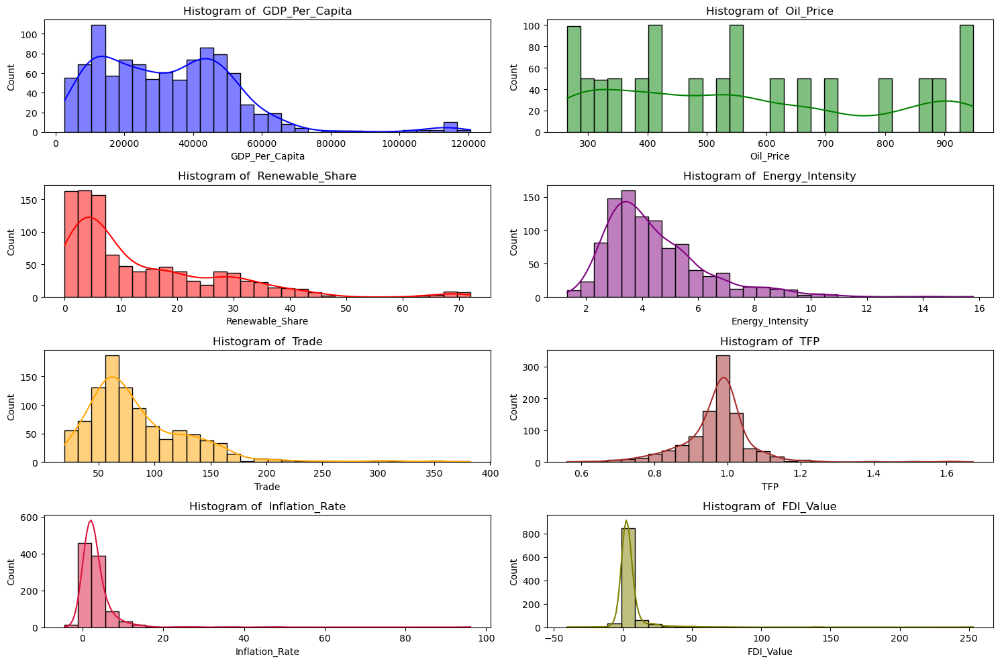

In [2232]:

variables = ["GDP_Per_Capita", "Oil_Price", "Renewable_Share", "Energy_Intensity", "Trade", "TFP","Inflation_Rate","FDI_Value"]
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 10))
axes = axes.flatten()

colors = ["blue", "green", "red", "purple", "orange", "brown","crimson", "olive"]

for i, (var, color) in enumerate(zip(variables, colors)):
    sns.histplot(df_final_merged[var], bins=30, kde=True, ax=axes[i], color=color)
    axes[i].set_title(f"Histogram of  {var}")

plt.tight_layout()
plt.show()


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1718: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1718: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1718: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1718: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1718: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid
/opt/anaconda3/

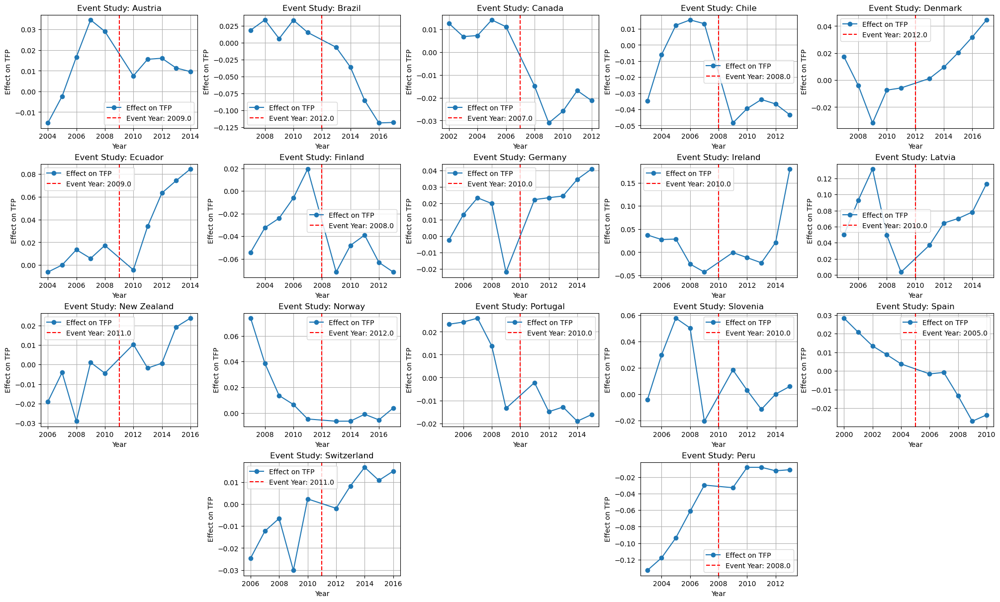

In [2153]:

# Define the fixed grid layout
num_rows = 4  
num_cols = 5  
total_subplots = num_rows * num_cols

event_year_column = "Event Year"  
unique_countries = [
    "Austria", "Brazil", "Canada", "Chile", "Denmark",
    "Ecuador", "Finland", "Germany", "Ireland", "Latvia",
    "New Zealand", "Norway", "Portugal", "Slovenia", "Spain",
    "Sweden", "Switzerland", "Colombia", "Peru", "France"
]  



fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 4, num_rows * 3), constrained_layout=True)
axes = axes.flatten()  

for i, country in enumerate(unique_countries):
    country_data = df_event_study[df_event_study["Country_Name"] == country].dropna()

    if event_year_column in country_data.columns and not country_data[event_year_column].isna().all():
        event_year = country_data[event_year_column].iloc[0]  
        if len(country_data) > len(event_time_dummies):  
            model_country = smf.ols("TFP ~ " + " + ".join(event_time_dummies), data=country_data).fit()

            event_time_coeffs = model_country.params[event_time_dummies]
            event_time_se = model_country.bse[event_time_dummies]

            event_time_se = event_time_se.fillna(0.0001)

            event_study_results_country = pd.DataFrame({
                "Event_Time": [-5, -4, -3, -2, -1, 1, 2, 3, 4, 5],
                "Year": [event_year + t for t in [-5, -4, -3, -2, -1, 1, 2, 3, 4, 5]],  
                "Coefficient": event_time_coeffs.values
            })

            ax = axes[i]
            ax.plot(event_study_results_country["Year"], event_study_results_country["Coefficient"], marker="o", linestyle="-", label="Effect on TFP")
            ax.axvline(x=event_year, color="red", linestyle="--", label=f"Event Year: {event_year}")
            ax.set_xlabel("Year")
            ax.set_ylabel("Effect on TFP")
            ax.set_title(f"Event Study: {country}")
            ax.legend()
            ax.grid(True)
        else:
            axes[i].axis("off")  
    else:
        axes[i].axis("off")  

for j in range(i + 1, total_subplots):
    fig.delaxes(axes[j])

plt.savefig("Event Study Pattern.png", dpi=600)
plt.show()


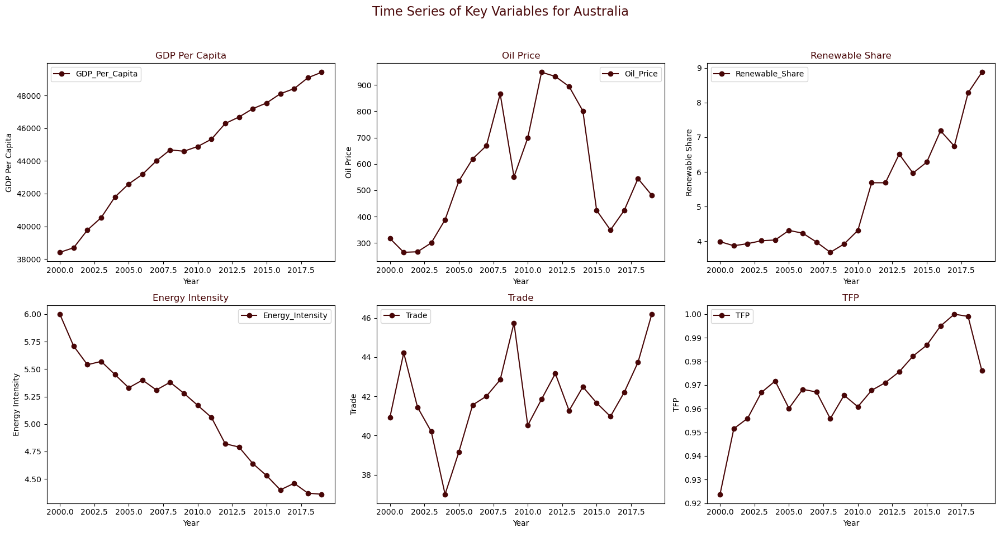

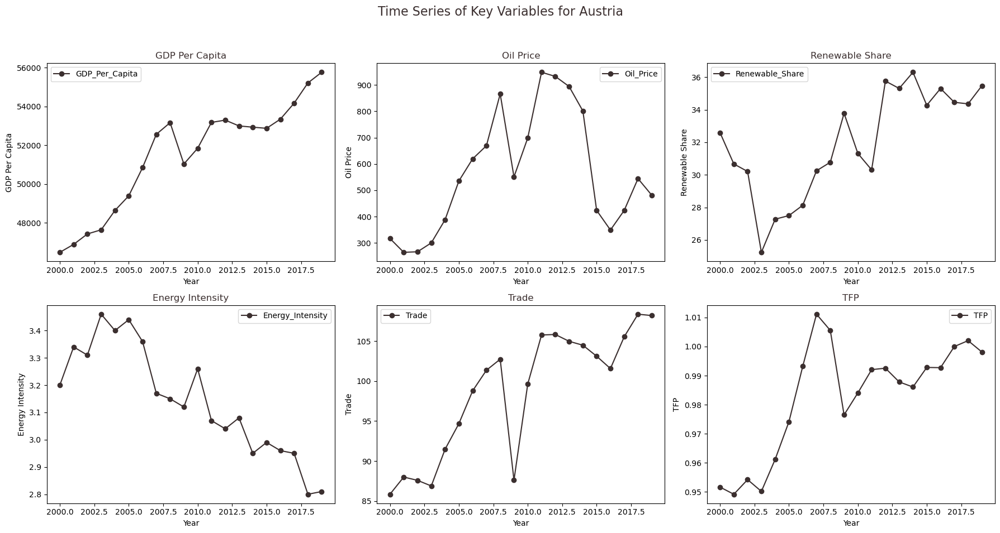

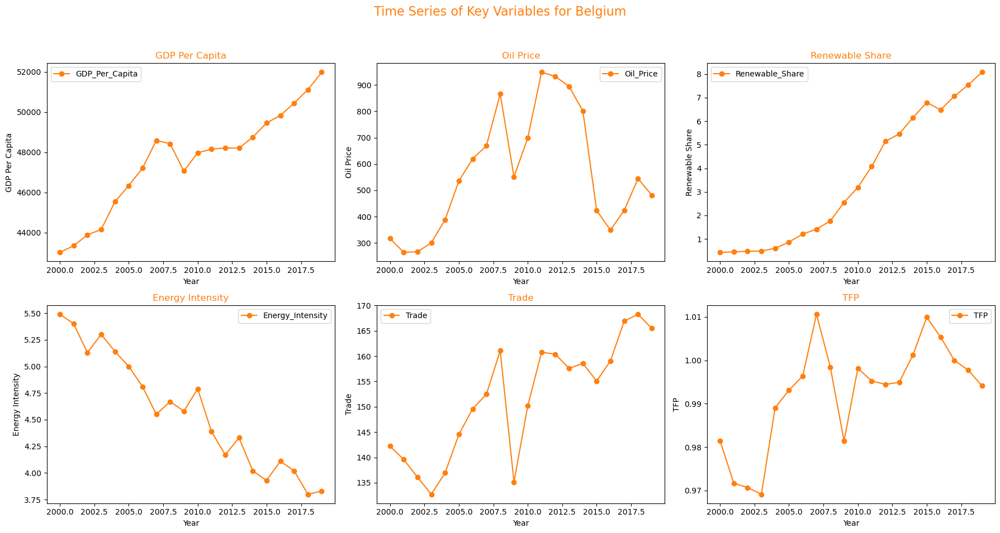

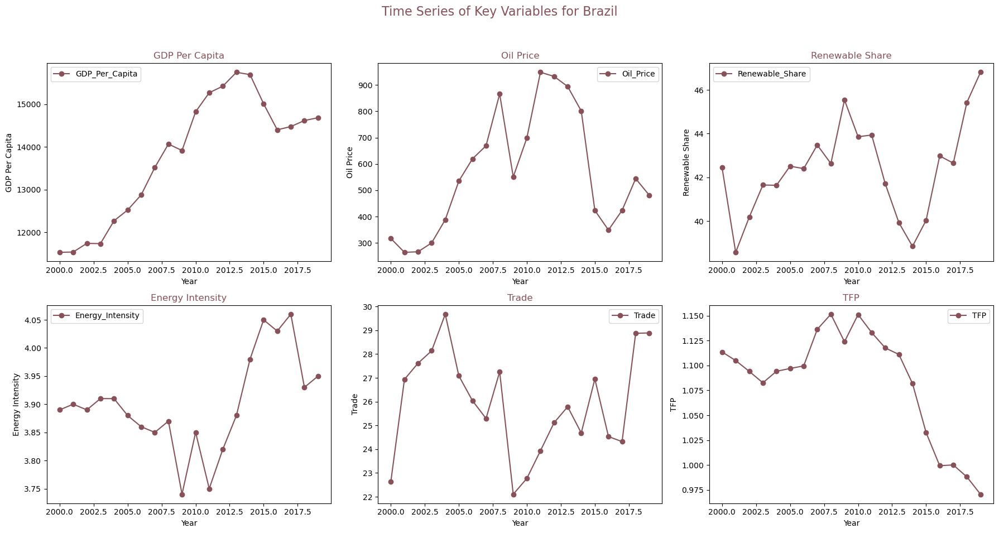

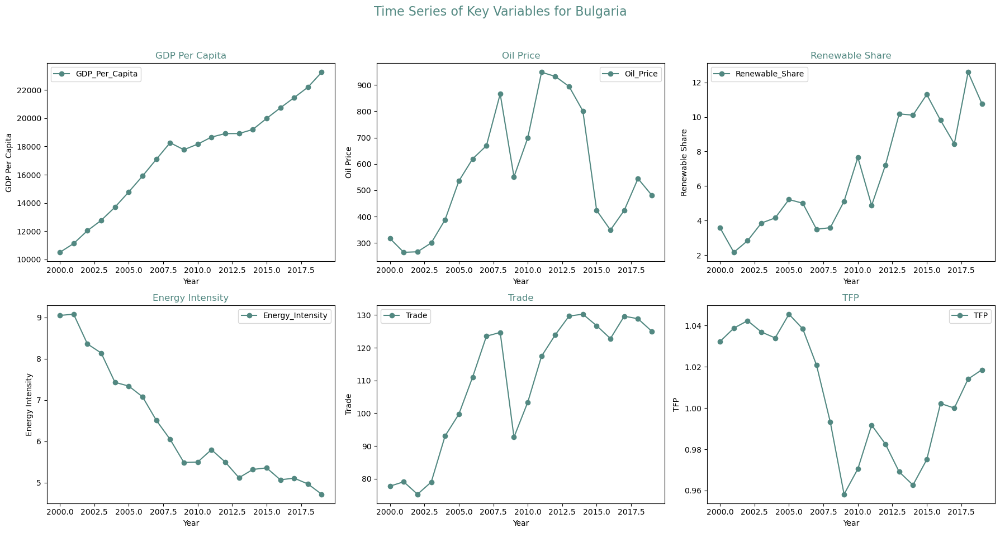

...

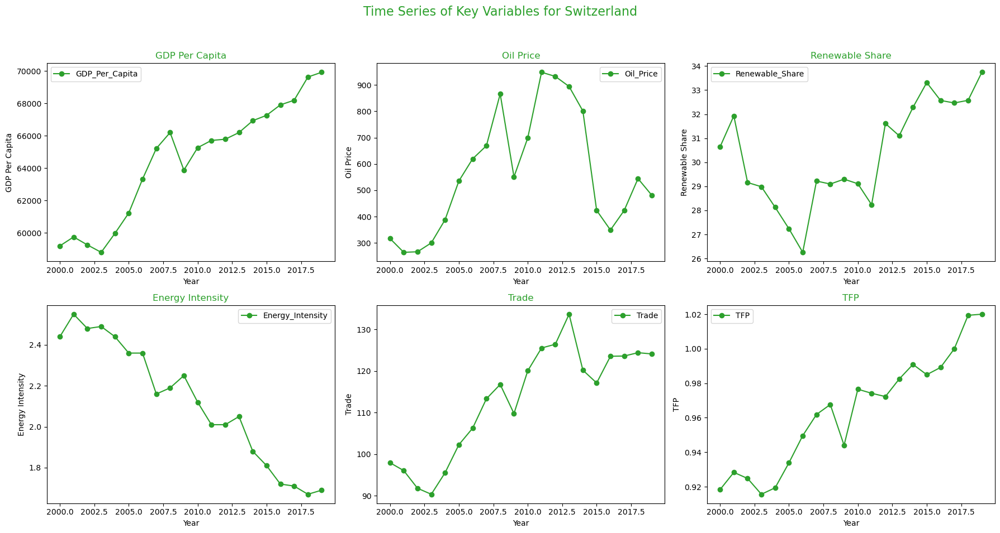

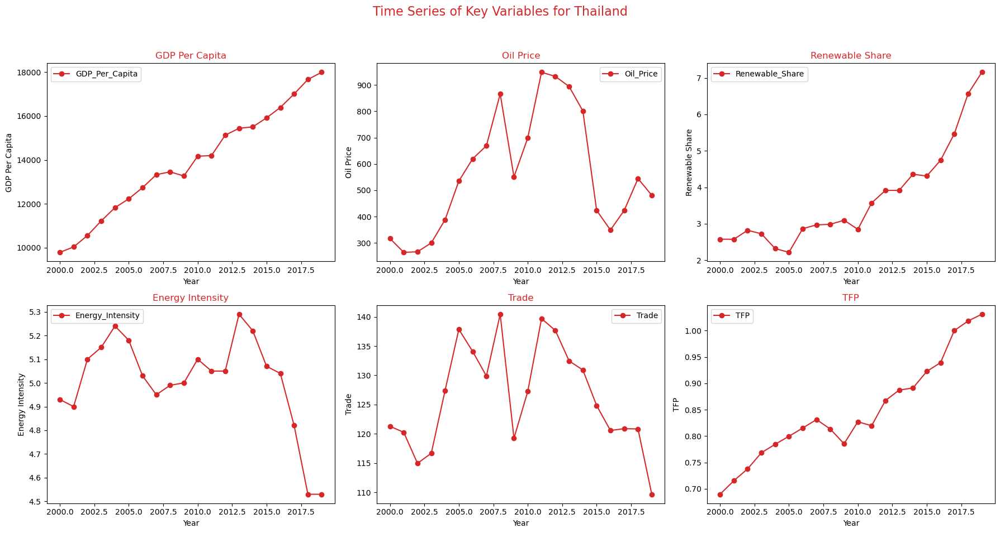

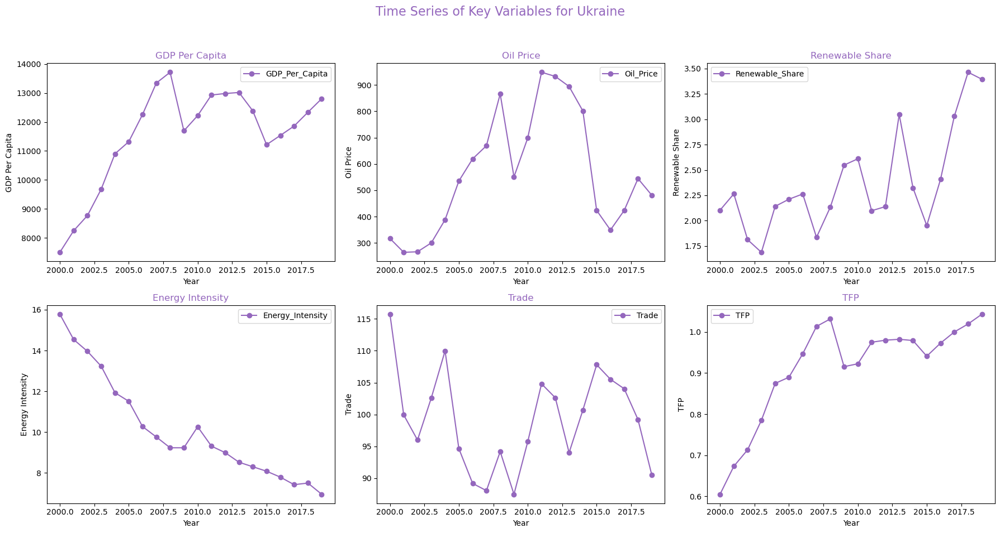

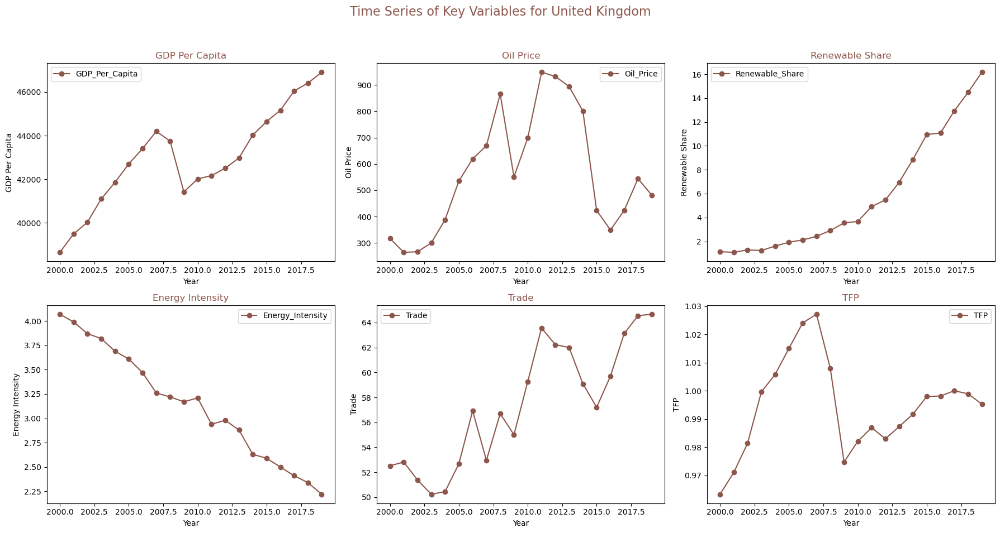

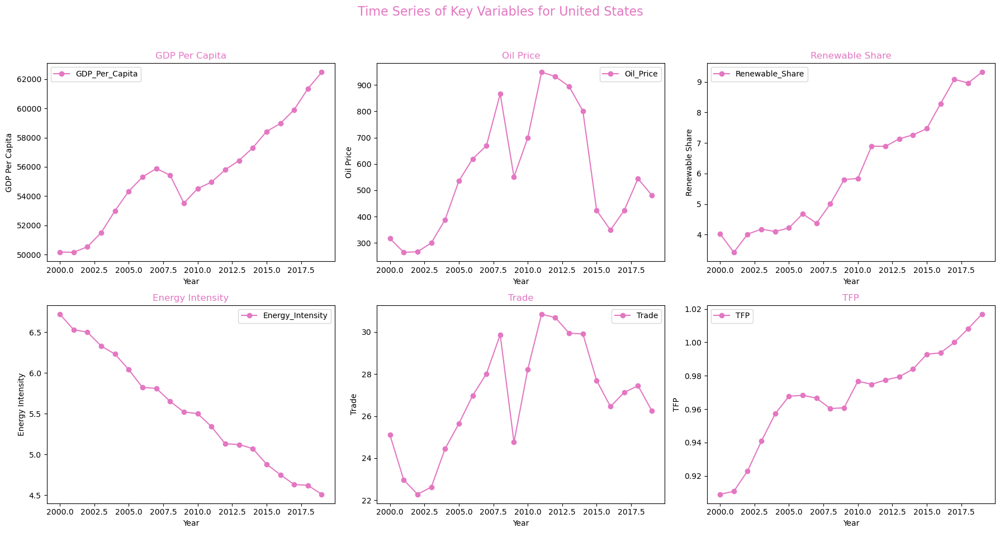

In [2152]:

variables = ["GDP_Per_Capita", "Oil_Price", "Renewable_Share", "Energy_Intensity", "Trade", "TFP","Inflation_Rate","FDI_Value"]

df_final_merged["Year"] = df_final_merged["Year"].astype(int)

unique_countries = df_final_merged["Country_Name"].unique()

custom_palette = sns.color_palette([
    "#480607", "#3b2f2f", "#ff7f0e", "#885159", "#528881", "#004b49",
    "#d18848", "#2ca02c", "#d62728", "#9467bd", "#8c564b",
    "#e377c2", "#7f7f7f", "#ffc627", "#bcbd22", "#17becf",
    "#876e70", "#a90201", "#a90201"
])

country_colors = dict(zip(unique_countries, custom_palette * (len(unique_countries) // len(custom_palette) + 1)))

# Generate time series plots for each country
for country in unique_countries:
    country_data = df_final_merged[df_final_merged["Country_Name"] == country]
    country_color = country_colors[country]

    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10), sharex=False)
    fig.suptitle(f"Time Series of Key Variables for {country}", fontsize=16, color=country_color)

    for ax, var in zip(axes.flatten(), variables):
        if var in country_data.columns:
            ax.plot(country_data["Year"], country_data[var], marker="o", linestyle="-", label=var, color=country_color)
            ax.set_title(var.replace("_", " "), color=country_color)
            ax.set_xlabel("Year")
            ax.set_ylabel(var.replace("_", " "))
            ax.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("time series.png", dpi=600)
    plt.show()

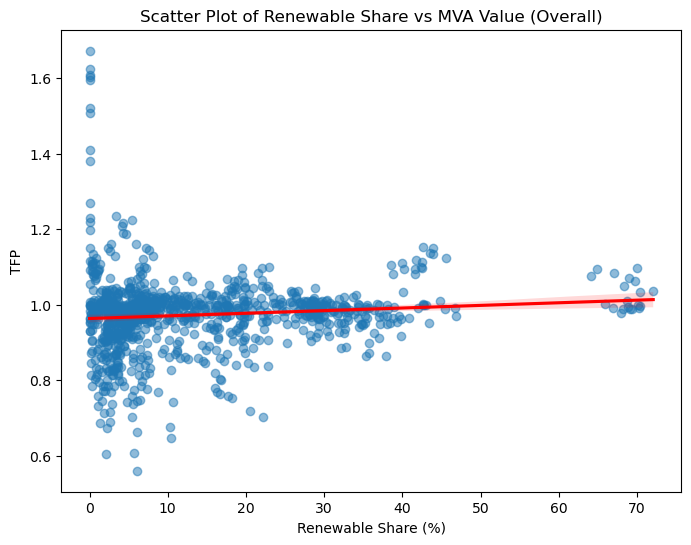

In [2148]:
plt.figure(figsize=(8, 6))
sns.regplot(data=df_final_merged, x="Renewable_Share", y="TFP", scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title("Scatter Plot of Renewable Share vs MVA Value (Overall)")
plt.xlabel("Renewable Share (%)")
plt.ylabel("TFP")
plt.savefig('overal scatter plot.png',dpi=600, bbox_inches="tight")
plt.show()

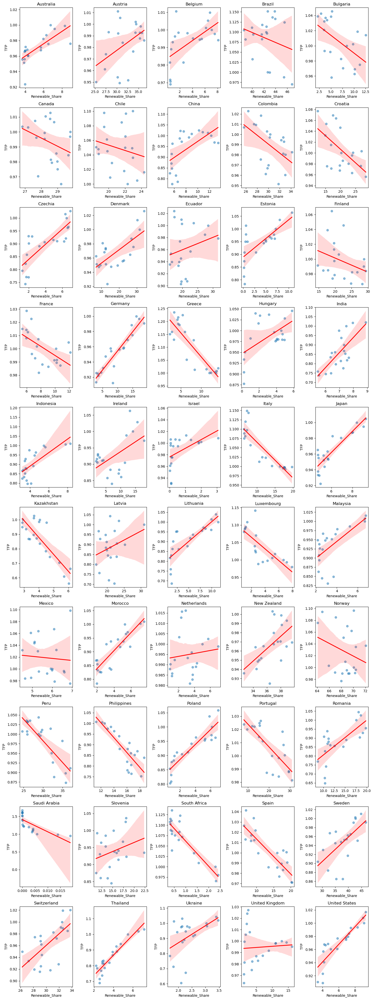

In [2144]:
unique_countries = df_final_merged["Country_Name"].unique()

cols = 5
rows = math.ceil(len(countries) / cols) 

fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15, 4 * rows), sharex=False, sharey=False)
axes = axes.flatten()

for i, country in enumerate(unique_countries):
    country_data = df_final_merged[df_final_merged["Country_Name"] == country]
    sns.regplot(data=country_data, x="Renewable_Share", y="TFP", scatter_kws={'alpha':0.5}, line_kws={'color':'red'}, ax=axes[i])
    axes[i].set_title(f"{country}")

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig('contries scatter plot.png',dpi=300, bbox_inches="tight")
plt.show()

#

In [ ]:
import math
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

df_final_merged["TFP_std"] = df_final_merged.groupby("Country_Name")["TFP"].transform(zscore)
df_final_merged["Renewable_Share_std"] = df_final_merged.groupby("Country_Name")["Renewable_Share"].transform(zscore)

cols = 3  
rows = math.ceil(len(countries) / cols) 

fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15, 3 * rows), sharex=False, sharey=False)
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = df_final_merged[df_final_merged["Country_Name"] == country]

    sns.kdeplot(country_data["TFP_std"].dropna(), label="TFP (Standardized)", ax=axes[i], color="blue", fill=False)
    sns.kdeplot(country_data["Renewable_Share_std"].dropna(), label="Renewable Share (Standardized)", ax=axes[i], color="green", fill=False)

    axes[i].set_title(f"{country}")
    axes[i].legend()

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig("heatmap all countries.png", dpi=600)
plt.show()


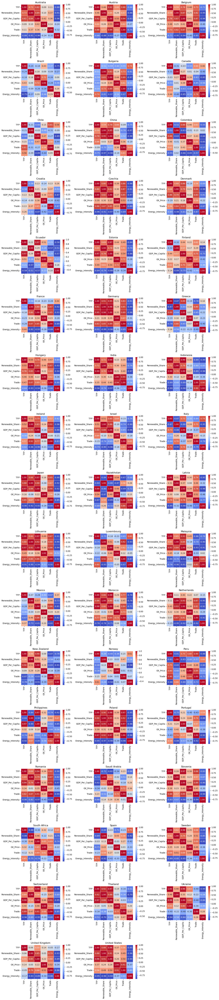

In [2140]:
countries = df_final_merged["Country_Name"].unique()
cols = 3
rows = math.ceil(len(countries) / cols) 

fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15, 4 * rows))
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = df_final_merged[df_final_merged["Country_Name"] == country][["TFP", "Renewable_Share", "GDP_Per_Capita", "Oil_Price", "Trade", "Energy_Intensity"]]
    country_corr = country_data.corr()
    
    sns.heatmap(country_corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5, ax=axes[i])
    axes[i].set_title(f"{country}")

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

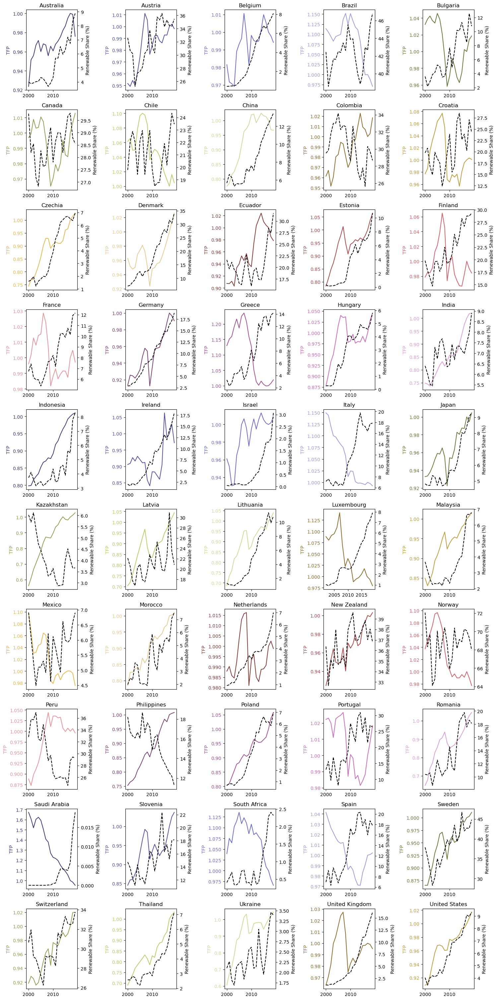

In [2136]:
df_final_merged['Year'] = df_final_merged['Year'].astype(int)
countries = df_final_merged["Country_Name"].unique()

num_countries = len(unique_countries)

cols = 5
rows = math.ceil(num_countries / cols) 

fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15, 3 * rows), sharex=False)

axes = axes.flatten()

palette = sns.color_palette("tab20b", num_countries)

for i, (country, color) in enumerate(zip(countries, palette)):
    country_data = df_final_merged[df_final_merged["Country_Name"] == country].groupby("Year")[["TFP", "Renewable_Share"]].mean().reset_index()
    
    ax1 = axes[i]
    ax1.plot(country_data["Year"], country_data["TFP"], marker='', linestyle='-', label="TFP", color=color)
    ax1.set_ylabel("TFP", color=color)
    ax1.tick_params(axis="y", labelcolor=color)
    
    ax2 = ax1.twinx()
    ax2.plot(country_data["Year"], country_data["Renewable_Share"], marker='', linestyle='--', label="Renewable Share", color="black")
    ax2.set_ylabel("Renewable Share (%)", color="black")
    ax2.tick_params(axis="y", labelcolor="black")
    
    ax1.set_title(f"{country}")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Common x-label
plt.xlabel("Year")
plt.tight_layout()
plt.show()

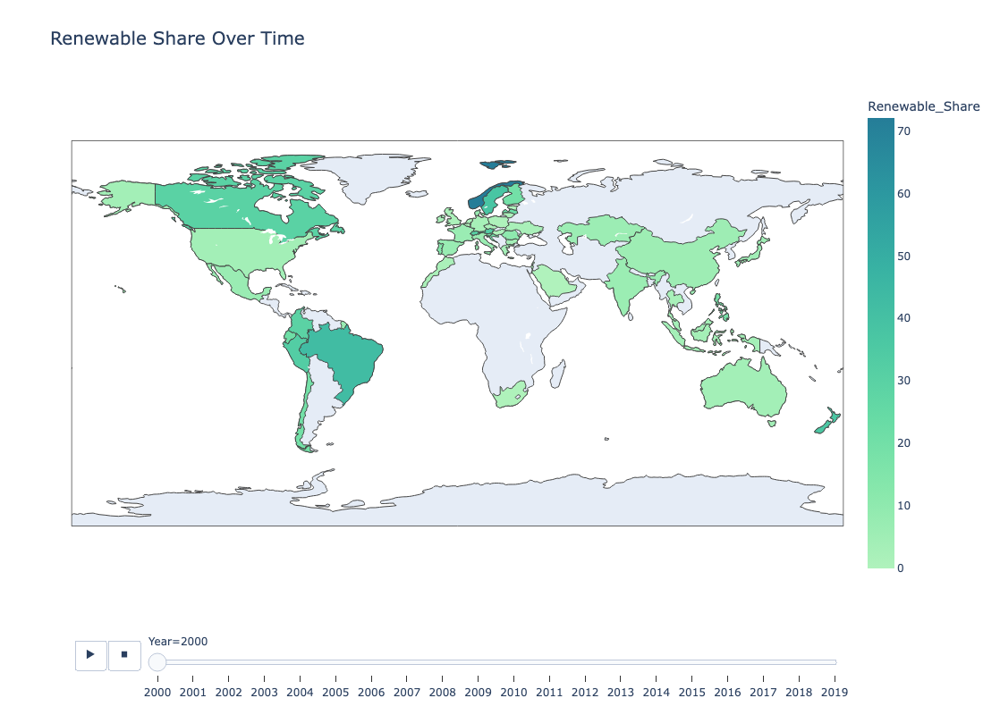

In [2199]:

fig = px.choropleth(
    df_final_merged,
    locations="Country_Code",
    locationmode="ISO-3",
    color="Renewable_Share",  # Default variable
    hover_name="Country_Name",
    color_continuous_scale="tealgrn",
    title="Renewable Share Over Time",
    animation_frame="Year",  # Enables year selection dynamically
)


# Increase map size and formatting
fig.update_layout(
    width=1200,  # Bigger width
    height=800,  # Bigger height
    title_font_size=20,  # Larger title
    geo=dict(
        projection_scale=1,  # Adjust zoom level
        showcoastlines=True,  # Show borders
    ),
)

fig.show()

fig.write_html("renewable_energy_map.html")


In [2193]:
pip install kaleido

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.8/85.8 MB 3.6 MB/s eta 0:00:0000:0100:010m
Note: you may need to restart the kernel to use updated packages.


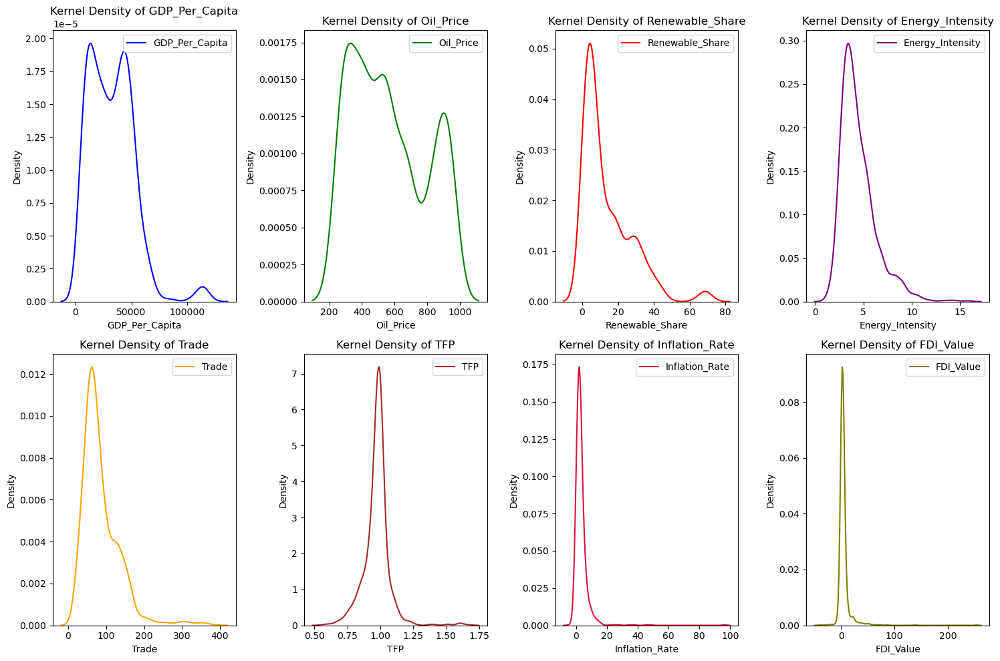

In [2218]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 10))
axes = axes.flatten()

colors = ["blue", "green", "red", "purple", "orange", "brown","crimson", "olive"]

for i, (var, color) in enumerate(zip(variables, colors)):
    sns.kdeplot(df_final_merged[var], label=var, ax=axes[i], color=color, fill=False)
    axes[i].set_title(f"Kernel Density of {var}")
    axes[i].legend()

plt.tight_layout()
plt.savefig("Kernel density overall.png")
plt.show()


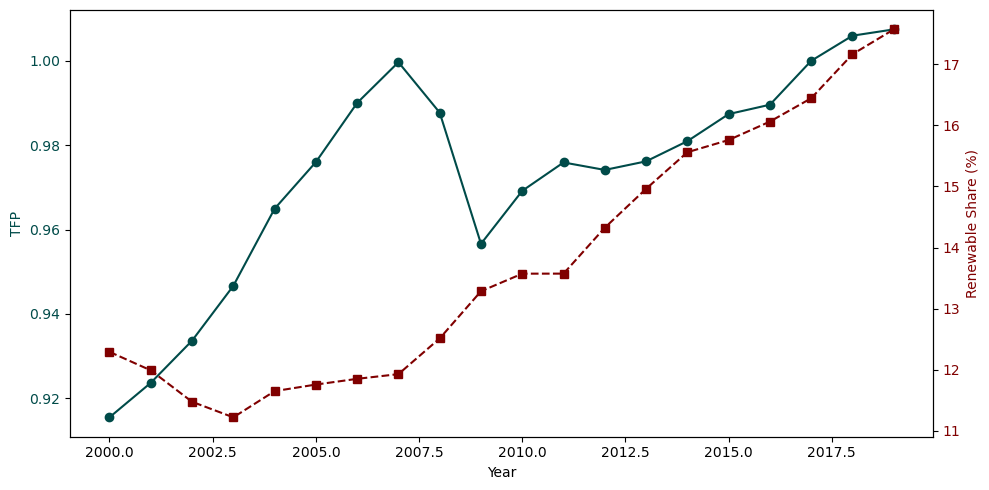

In [2228]:
#plot MVA and Renewable_share trend Aggreage mean across all countries
df_final_merged['Year'] =df_final_merged['Year'].astype(int)

df_trends = df_final_merged.groupby("Year")[["TFP", "Renewable_Share"]].mean().reset_index()

fig, ax1 = plt.subplots(figsize=(10, 5))

ax1.plot(df_trends["Year"], df_trends["TFP"], marker='o', linestyle='-', label="TFP", color="#004b49")
ax1.set_xlabel("Year")
ax1.set_ylabel("TFP", color="#004b49")
ax1.tick_params(axis="y", labelcolor="#004b49")

# Create a second y-axis for Renewable Share
ax2 = ax1.twinx()
ax2.plot(df_trends["Year"], df_trends["Renewable_Share"], marker='s', linestyle='--', label="Renewable Share", color="#800000")
ax2.set_ylabel("Renewable Share (%)", color="#800000")
ax2.tick_params(axis="y", labelcolor="#800000")

# Title and legend
fig.tight_layout()
plt.savefig("Trend_over_time.png")
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning:

invalid value encountered in log1p



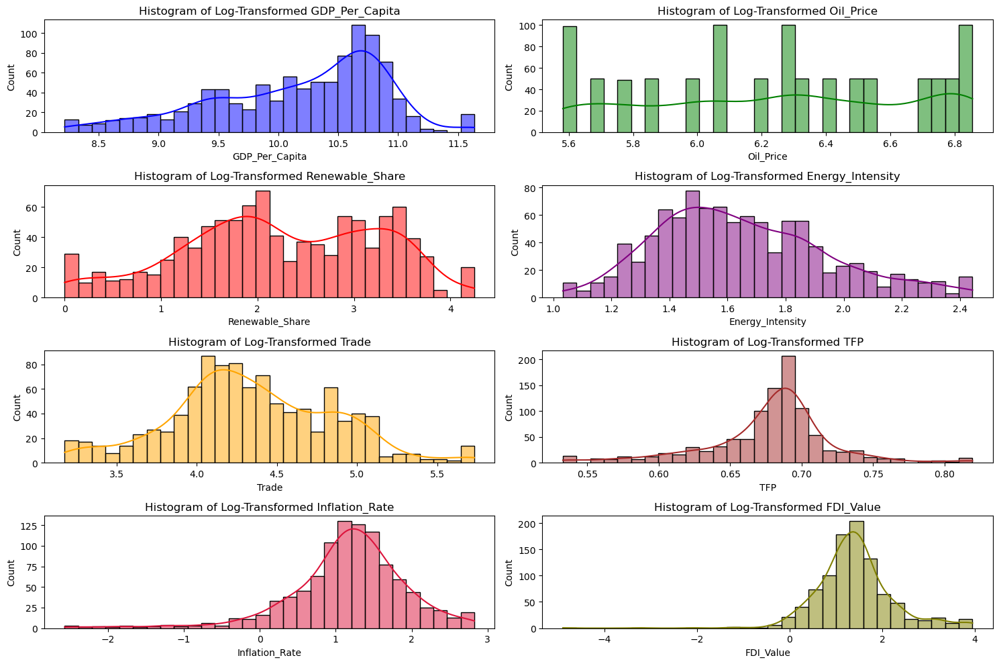

In [2236]:
df_winsorized = df_final_merged.copy()

for var in variables:
    df_winsorized[var] = winsorize(df_final_merged[var], limits=[0.01, 0.01])  

df_log_transformed = df_winsorized.copy()
for var in variables:
    df_log_transformed[var] = np.log1p(df_winsorized[var])

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 10))
axes = axes.flatten()

colors = ["blue", "green", "red", "purple", "orange", "brown","crimson", "olive"]

for i, (var, color) in enumerate(zip(variables, colors)):
    sns.histplot(df_log_transformed[var], bins=30, kde=True, ax=axes[i], color=color)
    axes[i].set_title(f"Histogram of Log-Transformed {var}")

plt.tight_layout()
plt.show()


/var/folders/6n/p578p__s54j_ngsncpgm562m0000gn/T/ipykernel_66304/2898683906.py:16: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



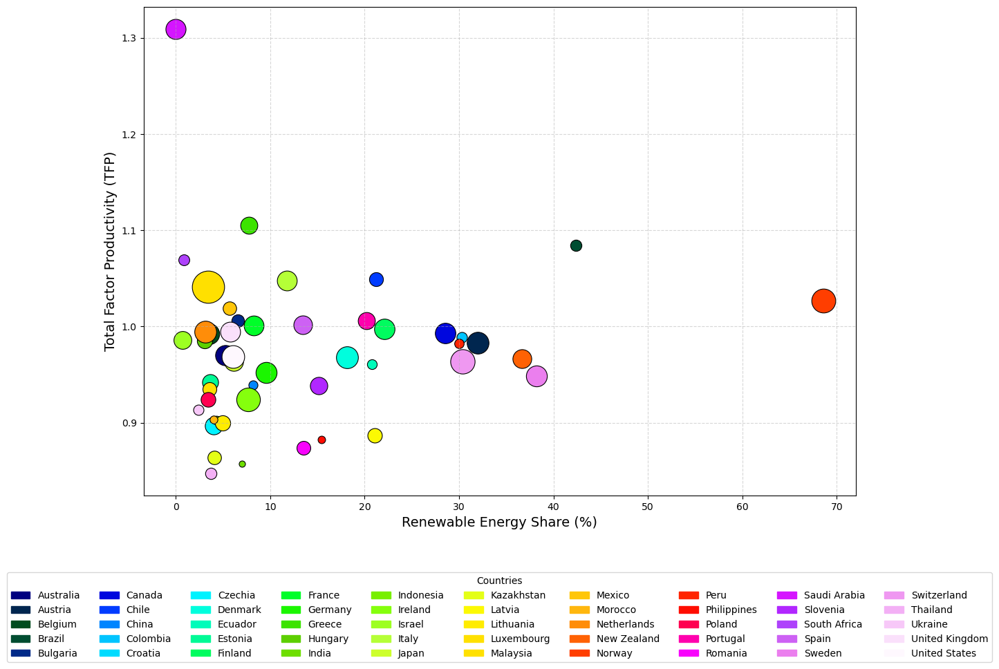

In [2238]:

df = df_final_merged

mean_data = df.groupby(['Country_Name'], as_index=False).agg({
    'TFP': 'mean',
    'Renewable_Share': 'mean',
    'GDP_Per_Capita': 'mean'
})

plt.figure(figsize=(14, 10))

countries = mean_data['Country_Name'].unique()

cmap = plt.cm.get_cmap("gist_ncar", len(countries))  # Alternatives: "turbo", "rainbow", "hsv"

color_dict = {country: cmap(i / len(countries)) for i, country in enumerate(countries)}

for country in countries:
    subset = mean_data[mean_data['Country_Name'] == country]
    plt.scatter(
        subset['Renewable_Share'],
        subset['TFP'],
        s=subset['GDP_Per_Capita'] / 100,  # Adjust bubble size
        color=color_dict[country],
        alpha=1,
        edgecolors='black',
        linewidth=0.8
    )

plt.xlabel('Renewable Energy Share (%)', fontsize=14)
plt.ylabel('Total Factor Productivity (TFP)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)

legend_patches = [mpatches.Circle((0, 0), radius=5, color=color_dict[country], label=country) for country in countries]

plt.legend(handles=legend_patches, loc='lower center', bbox_to_anchor=(0.5, -0.35),
           ncol=10, fontsize=10, title="Countries", frameon=True)

plt.tight_layout()

# Show the plot
plt.savefig("scatter plot_colorized.png")
plt.show()
